<a href="https://colab.research.google.com/github/codedmachine111/ML/blob/master/Deep%20Learning/Image_Warping.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# import required libraries
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

In [ ]:
!cp /content/drive/MyDrive/base-wp.png /content
!cp /content/drive/MyDrive/subject.png /content

In [ ]:
base = cv2.imread('/content/base-wp.png')
subject = cv2.imread('/content/subject.png')

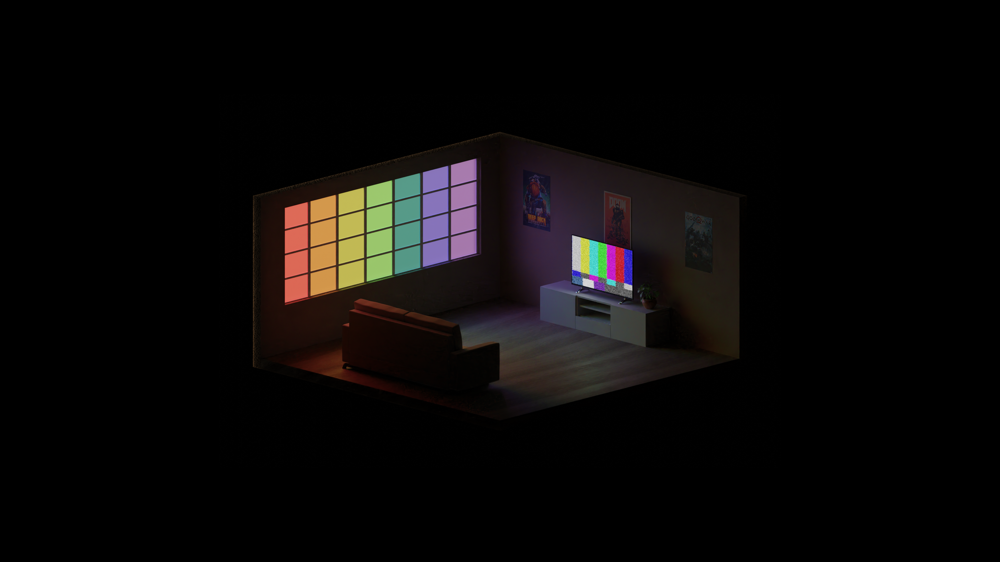

In [ ]:
cv2_imshow(base)

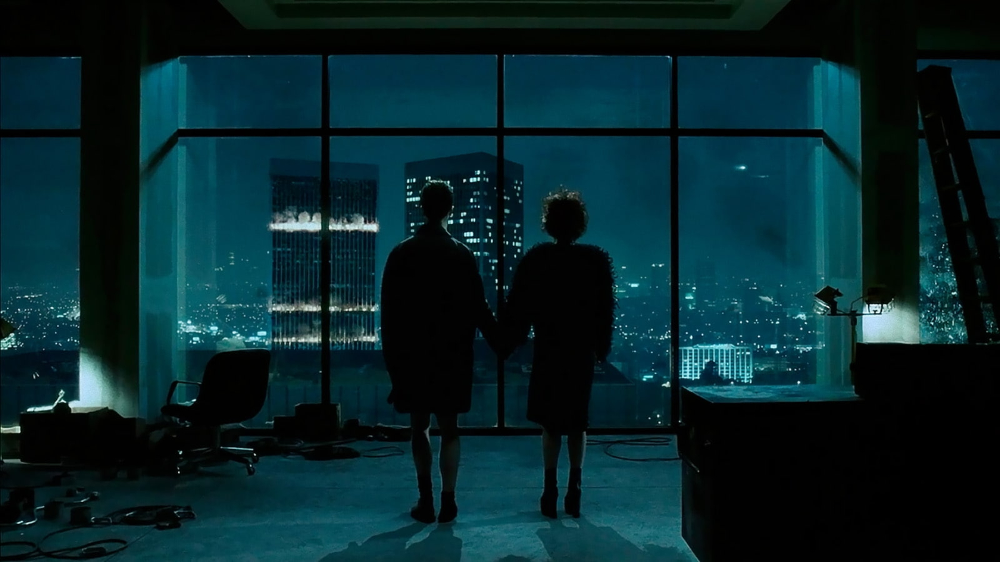

In [ ]:
cv2_imshow(subject)

In [ ]:
points = [[2196, 903], [2428, 963], [2428, 1147], [2196, 1087]]

In [ ]:
h_base, w_base = base.shape[:2]
h_subject, w_subject = subject.shape[:2]

In [ ]:
pts1 = np.float32([[0,0],[w_subject, 0], [w_subject, h_subject], [0, h_subject]])
pts2 = np.float32(points)

In [ ]:
transformation_matrix = cv2.getPerspectiveTransform(pts1, pts2)

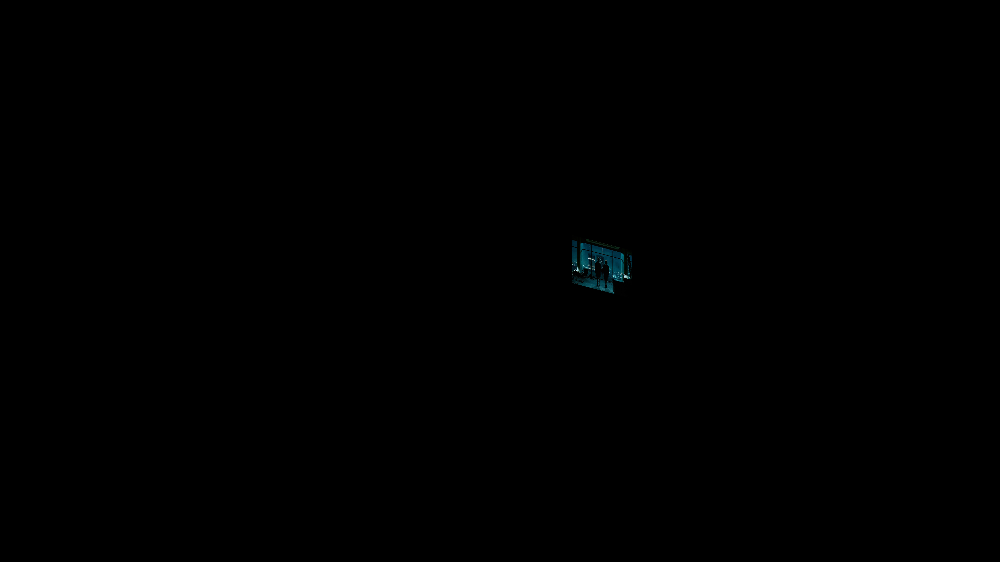

In [ ]:
warped_image = cv2.warpPerspective(subject, transformation_matrix, (w_base,h_base))
cv2_imshow(warped_image)

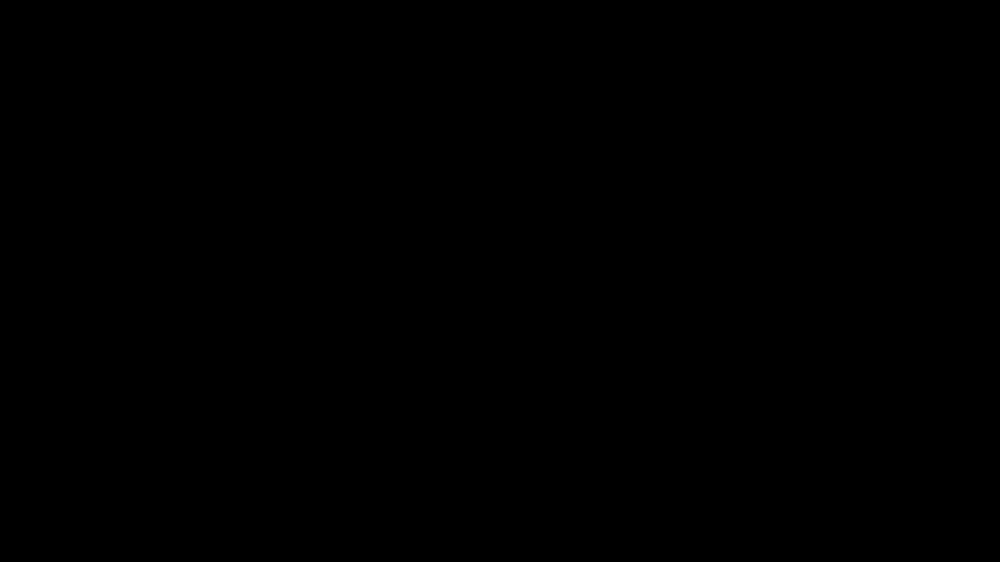

In [ ]:
mask = np.zeros(base.shape, dtype=np.uint8)
cv2_imshow(mask)

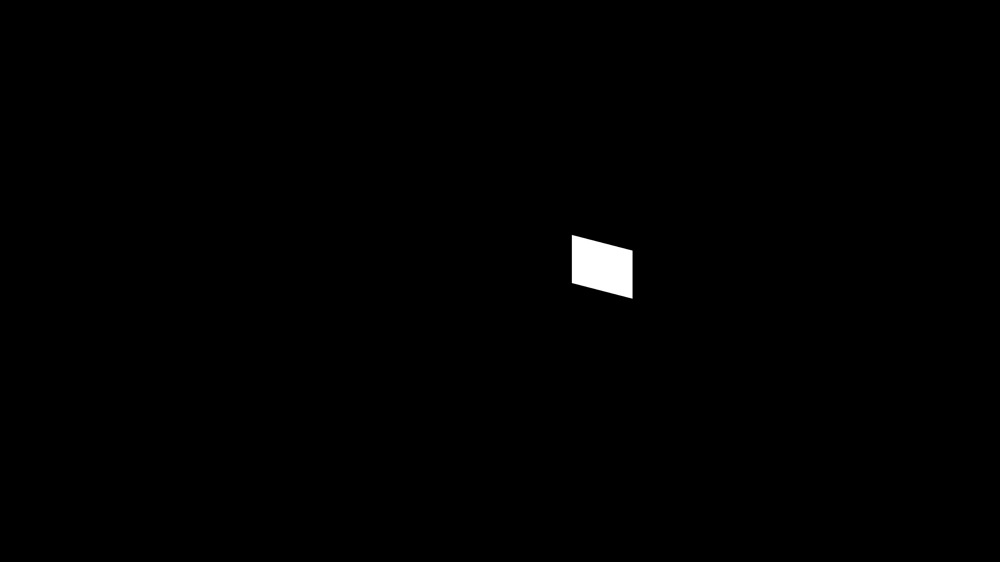

In [ ]:
roi_corners = np.int32(points)

cv2.fillConvexPoly(mask, roi_corners, (255, 255, 255))
cv2_imshow(mask)

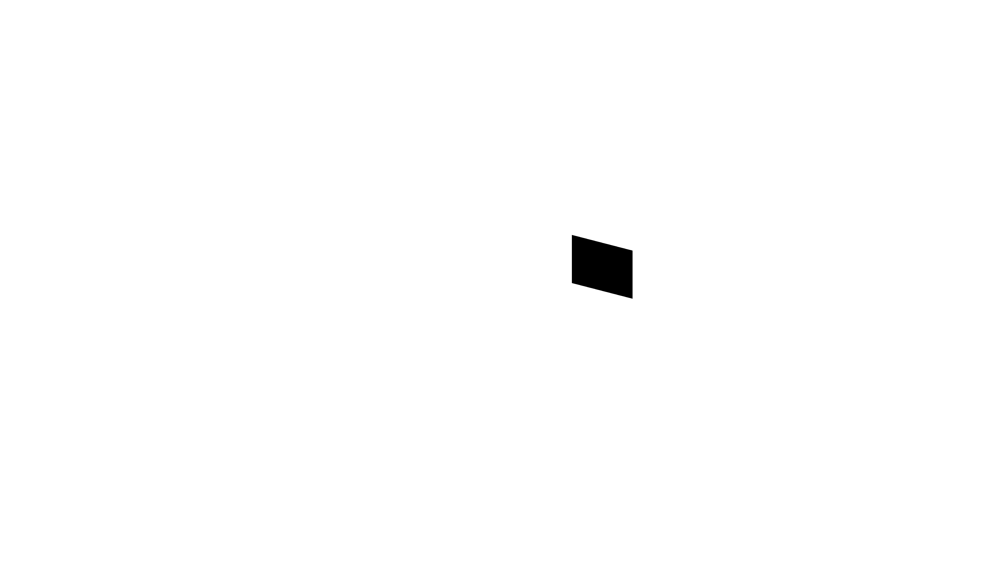

In [ ]:
mask = cv2.bitwise_not(mask)
cv2_imshow(mask)

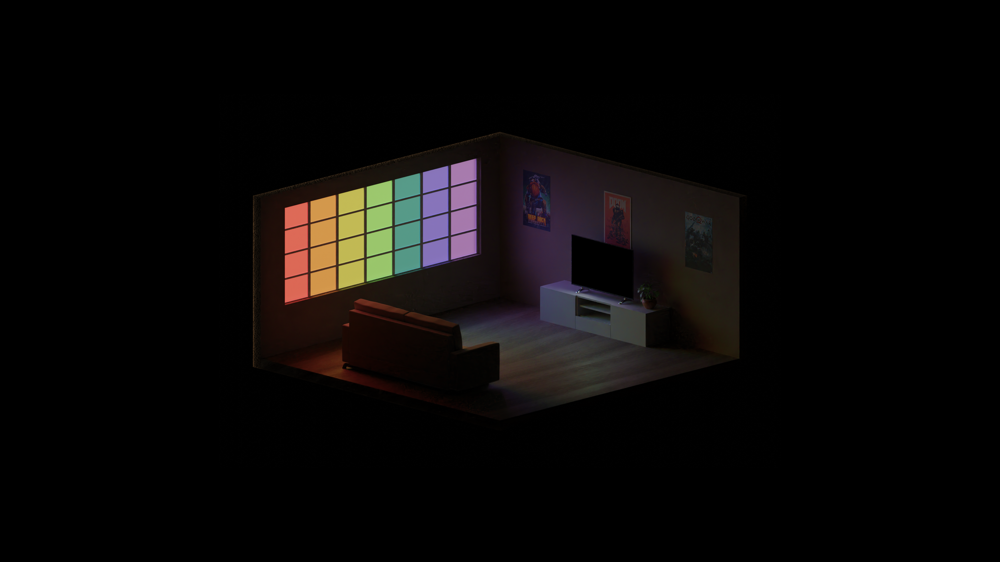

In [ ]:
masked_image = cv2.bitwise_and(mask, base)
cv2_imshow(masked_image)

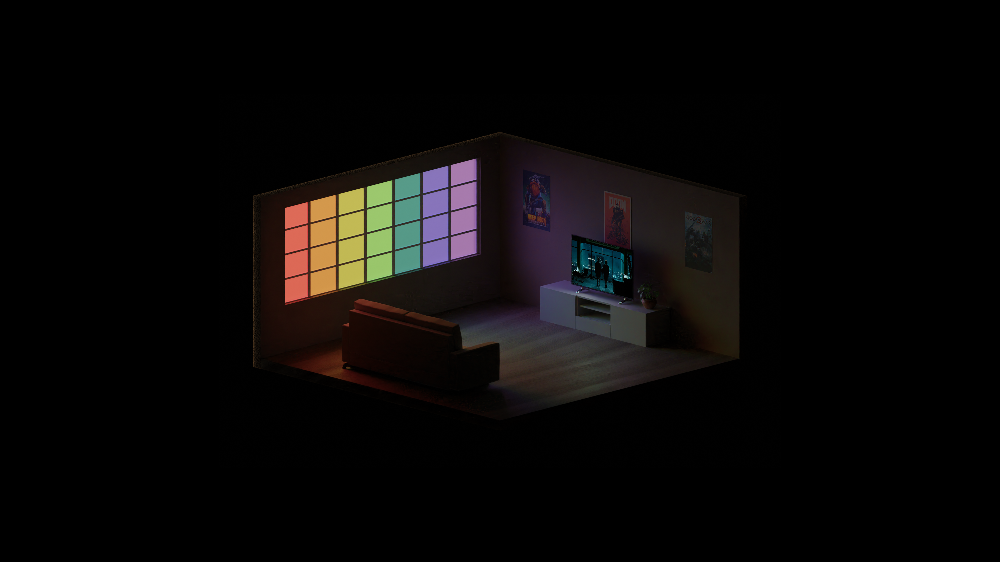

In [ ]:
res_img = cv2.bitwise_or(masked_image, warped_image)
cv2_imshow(res_img)

In [ ]:
cv2.imwrite('bg.png',res_img)

True

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 3)

axes[0, 0].imshow(base)
axes[0, 0].set_title("Base Image")

axes[0, 1].imshow(subject)
axes[0, 1].set_title("Subject Image")

axes[0, 2].imshow(warped_image)
axes[0, 2].set_title("Warped Image")

axes[1, 0].imshow(mask)
axes[1, 0].set_title("Mask Image")

axes[1, 1].imshow(masked_image)
axes[1, 1].set_title("Masked Image")

axes[1, 2].imshow(res_img)
axes[1, 2].set_title("Result Image")

# Optionally, you can adjust the spacing between subplots to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()